<a href="https://colab.research.google.com/github/luciazhng-web/GeoLife_Trajectory_Mode_Detection/blob/main/2_BasicFatures%26Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This section will include:
1. Basic features extraction


*   Projection: lon，lat -> X, Y coordinates
*   Transform alt(in feet) to alt_m in meter
*   Sampling rate/dt_sec
*   Distance in meter
*   Speed_mps
*   Heading

2. Stop Point and Orientation abnormal detection
3. Savitzky-Golay filter

In [ ]:
import pandas as pd
import numpy as np
import ast
import matplotlib.pyplot as plt
from os import preadv
from tqdm import tqdm
import seaborn as sns
from scipy.stats import mode
from pyproj import CRS, Transformer, Proj
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')
DATA_ROOT_DIR = '/content/drive/MyDrive/its_geolife/'
#raw_trajectory_labeled_df = pd.read_csv("/content/drive/MyDrive/its_geolife/rawdata/raw_trajectory_labeled_df.csv",parse_dates=["datetime"],na_values=["NaN"])

Mounted at /content/drive


In [ ]:
# projection
crs_wgs84 = CRS.from_epsg(4326)
crs_utm = CRS.from_epsg(32650) # only applies for Beijing
crs_web = CRS.from_epsg(3857)

In [ ]:
# Display summary statistics after execution
if 'raw_trajectory_labeled_df' in locals():
    print("DataFrame Info:")
    raw_trajectory_labeled_df.info()

# Get the counts for each mode directly
mode_counts = raw_trajectory_labeled_df['modes'].value_counts()

print("Counts for each mode:")
print(mode_counts)

raw_trajectory_labeled_df.describe(include='all')

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5953522 entries, 0 to 5953521
Data columns (total 8 columns):
 #   Column     Dtype         
---  ------     -----         
 0   user_id    int64         
 1   lat        float64       
 2   lon        float64       
 3   alt        float64       
 4   datetime   datetime64[ns]
 5   file_name  object        
 6   modes      object        
 7   trip_id    object        
dtypes: datetime64[ns](1), float64(3), int64(1), object(3)
memory usage: 363.4+ MB
Counts for each mode:
modes
walk         1113120
bus           783631
bike          490179
car           487918
subway        187186
train         130430
taxi          109540
airplane        5979
boat            3602
railway         3286
run             3186
motocycle        338
Name: count, dtype: int64


,user_id,lat,lon,alt,datetime,file_name,modes,trip_id
count,5.953522e+06,5.953522e+06,5.953522e+06,5.953522e+06,5953522,5953522,3318395,3319951
unique,NaN,NaN,NaN,NaN,NaN,2047,12,6124
top,NaN,NaN,NaN,NaN,NaN,20080607-20080609.plt,walk,031_00197
freq,NaN,NaN,NaN,NaN,NaN,134926,1113120,18286
mean,1.973308e+01,4.003439e+01,1.104501e+02,6.451327e+02,2008-10-26 01:48:57.585349376,NaN,NaN,NaN
min,6.000000e+00,-2.138479e+01,-1.799696e+02,-3.275590e+04,2007-04-12 18:18:53,NaN,NaN,NaN
25%,1.200000e+01,3.993951e+01,1.163196e+02,9.840000e+01,2008-07-18 08:55:51.500000,NaN,NaN,NaN
50%,2.100000e+01,3.998057e+01,1.163376e+02,1.509000e+02,2008-10-04 18:17:27,NaN,NaN,NaN
75%,2.700000e+01,4.000777e+01,1.164190e+02,2.190000e+02,2009-01-09 08:20:49.750000128,NaN,NaN,NaN
max,3.200000e+01,6.171240e+01,1.799969e+02,3.280807e+05,2009-09-28 22:28:04,NaN,NaN,NaN


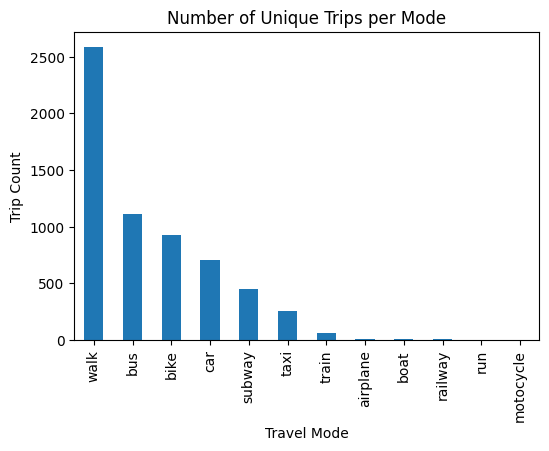

In [ ]:
mode_counts = raw_trajectory_labeled_df.groupby('modes')['trip_id'].nunique()
mode_counts.sort_values(ascending=False).plot(kind='bar', figsize=(6,4))
plt.title("Number of Unique Trips per Mode")
plt.xlabel("Travel Mode")
plt.ylabel("Trip Count")
plt.show()

## 1. Check the sampling rate

In [ ]:
df = raw_trajectory_labeled_df.sort_values(by=['user_id', 'file_name', 'datetime']).reset_index(drop=True)
df['dt_sec'] = df.groupby(['user_id','file_name'])['datetime'].diff().dt.total_seconds()
df['dt_sec'].describe()

,dt_sec
count,5.951282e+06
mean,3.383287e+01
std,2.866292e+03
min,1.000000e+00
25%,2.000000e+00
50%,2.000000e+00
75%,2.000000e+00
max,2.935507e+06


In [ ]:
df_temp = df[df['dt_sec']<=100]

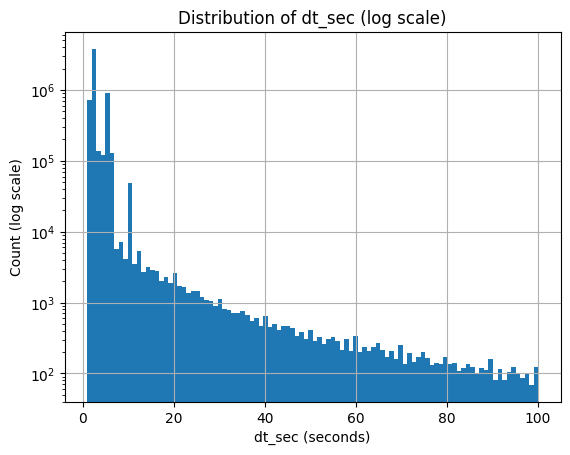

In [ ]:
df_temp['dt_sec'].hist(bins=100, log=True)
plt.xlabel("dt_sec (seconds)")
plt.ylabel("Count (log scale)")
plt.title("Distribution of dt_sec (log scale)")
plt.show()

Based on a hypothesis that each trajectory file is recorded via the same device, hence the sampling frequency should be identical. By calculate the mode of 'dt_sec' we can get the sampling frequency per user per trajectory file.

In [ ]:
from scipy.stats import mode

# Compute mode of dt_sec per (user_id, file_name)
df_temp = (
    df.groupby(['user_id', 'file_name'])['dt_sec']
      .agg(lambda x: mode(x, keepdims=True).mode[0])  # mode returns an array
      .reset_index(name='mode_dt_sec')
)
df_temp.head(10)

,user_id,file_name,mode_dt_sec
0,6,1-7.plt,2.0
1,6,1.plt,2.0
2,6,11.plt,2.0
3,6,11月10-16.plt,2.0
4,6,2.plt,2.0
5,6,2008-9-14至2008-9-20.plt,5.0
6,6,2008.plt,2.0
7,6,2009.plt,2.0
8,6,23-29.plt,2.0
9,6,3.plt,2.0


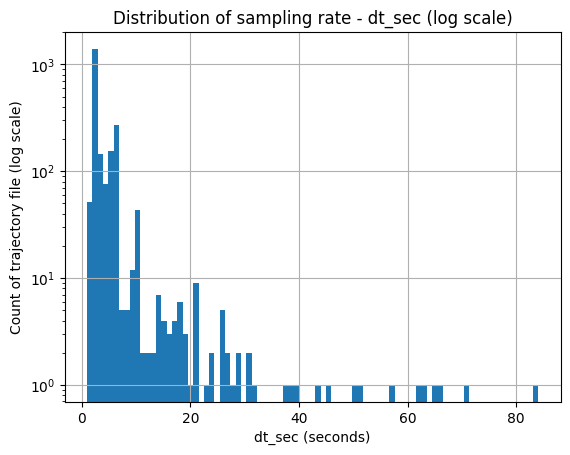

In [ ]:
df_temp['mode_dt_sec'].hist(bins=85, log=True)
plt.xlabel("dt_sec (seconds)")
plt.ylabel("Count of trajectory file (log scale)")
plt.title("Distribution of sampling rate - dt_sec (log scale)")
plt.show()

## 2. Basic Feature Extraction

In [ ]:
# convert from WGS84 to Web Mercator
def cal_distance_heading(df):

  transformer = Transformer.from_crs(crs_wgs84, crs_web)
  df['x'], df['y'] = transformer.transform(df['lat'], df['lon'])

  df['x_prev'] = df.groupby(['user_id', 'file_name'])['x'].shift(1)
  df['y_prev'] = df.groupby(['user_id', 'file_name'])['y'].shift(1)

  dx = df['x'] - df['x_prev']
  dy = df['y'] - df['y_prev']

  df['heading'] = np.degrees(np.arctan2(dy, dx))
  df['distance'] = np.sqrt(dx**2 + dy**2)
  df = df.drop(columns=['x_prev','y_prev'])

  return df

In [ ]:
df_features = cal_distance_heading(df)
df_features.head(5)

,user_id,lat,lon,alt,datetime,file_name,modes,trip_id,dt_sec,x,y,heading,distance
0,6,39.993189,116.420565,0.0,2008-12-01 07:49:36,1-7.plt,NaN,NaN,NaN,1.295988e+07,4.864953e+06,NaN,NaN
1,6,39.995136,116.417182,0.0,2008-12-01 07:49:38,1-7.plt,NaN,NaN,2.0,1.295950e+07,4.865235e+06,143.085030,471.020345
2,6,39.997684,116.412568,0.0,2008-12-01 07:49:40,1-7.plt,NaN,NaN,2.0,1.295899e+07,4.865606e+06,144.214043,633.165177
3,6,39.996701,116.414270,0.0,2008-12-01 07:49:42,1-7.plt,NaN,NaN,2.0,1.295918e+07,4.865463e+06,-37.013173,237.277965
4,6,39.993076,116.420262,0.0,2008-12-01 07:49:44,1-7.plt,NaN,NaN,2.0,1.295984e+07,4.864936e+06,-38.297354,849.926287


Convert altitude into meters

In [ ]:
# Convert unit from feet to meter for altitude
FEET_TO_METER = 0.3048
df_features['alt_m'] = df_features['alt'] * FEET_TO_METER
df_features = df_features.drop(columns=['alt'])
df_features.head(5)

,user_id,lat,lon,datetime,file_name,modes,trip_id,dt_sec,x,y,heading,distance,alt_m
0,6,39.993189,116.420565,2008-12-01 07:49:36,1-7.plt,NaN,NaN,NaN,1.295988e+07,4.864953e+06,NaN,NaN,0.0
1,6,39.995136,116.417182,2008-12-01 07:49:38,1-7.plt,NaN,NaN,2.0,1.295950e+07,4.865235e+06,143.085030,471.020345,0.0
2,6,39.997684,116.412568,2008-12-01 07:49:40,1-7.plt,NaN,NaN,2.0,1.295899e+07,4.865606e+06,144.214043,633.165177,0.0
3,6,39.996701,116.414270,2008-12-01 07:49:42,1-7.plt,NaN,NaN,2.0,1.295918e+07,4.865463e+06,-37.013173,237.277965,0.0
4,6,39.993076,116.420262,2008-12-01 07:49:44,1-7.plt,NaN,NaN,2.0,1.295984e+07,4.864936e+06,-38.297354,849.926287,0.0


Calculate Speed in m/s

In [ ]:
df_features['speed'] = df_features['distance']/df['dt_sec']
df_features.head(5)

,user_id,lat,lon,datetime,file_name,modes,trip_id,dt_sec,x,y,heading,distance,alt_m,speed
0,6,39.993189,116.420565,2008-12-01 07:49:36,1-7.plt,NaN,NaN,NaN,1.295988e+07,4.864953e+06,NaN,NaN,0.0,NaN
1,6,39.995136,116.417182,2008-12-01 07:49:38,1-7.plt,NaN,NaN,2.0,1.295950e+07,4.865235e+06,143.085030,471.020345,0.0,235.510173
2,6,39.997684,116.412568,2008-12-01 07:49:40,1-7.plt,NaN,NaN,2.0,1.295899e+07,4.865606e+06,144.214043,633.165177,0.0,316.582589
3,6,39.996701,116.414270,2008-12-01 07:49:42,1-7.plt,NaN,NaN,2.0,1.295918e+07,4.865463e+06,-37.013173,237.277965,0.0,118.638983
4,6,39.993076,116.420262,2008-12-01 07:49:44,1-7.plt,NaN,NaN,2.0,1.295984e+07,4.864936e+06,-38.297354,849.926287,0.0,424.963144


In [ ]:
#filtering extrem speed for plotting
df_temp = df_features[df_features['speed']<450]

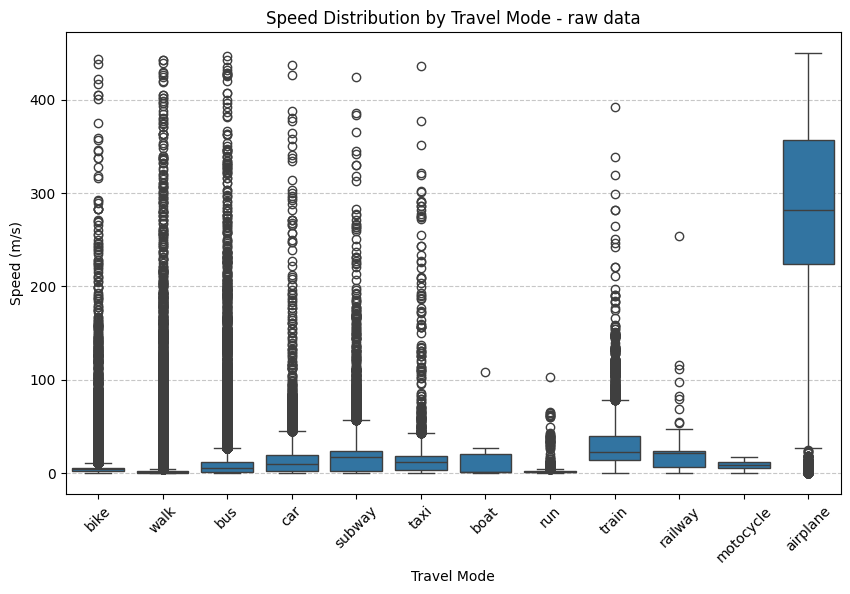

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(x='modes', y='speed', data=df_temp)

plt.title("Speed Distribution by Travel Mode - raw data")
plt.xlabel("Travel Mode")
plt.ylabel("Speed (m/s)")
plt.xticks(rotation=45)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.show()

## 3. Stop points detection and orientation drop

In [ ]:
# Set Parameters
SPEED_THRESHOLD = 0.8
SEGMENT_THRESHOLD = 3
HEADING_CHANGE_THRESHOLD = 50
ORIENTATION_TRUN_ANGLE = 130
ORIENTATION_DIST_THRESHOLD = 150
MAX_ITER = 3

def clean_stop_segments(df):

  df_temp = df.copy()
  df_temp['to_remove'] = False  # Initialization

  # === 1: Orientation filter ===
  def orientation_filter(df_inner):
    if 'orientation_drop' not in df_inner.columns:
      df_inner['orientation_drop'] = False

    df_inner['dist_2pts'] = np.sqrt(
        (df_inner['x'].shift(-1) - df_inner['x'].shift(1))**2 +
        (df_inner['y'].shift(-1) - df_inner['y'].shift(1))**2
      )

    df_inner['dt_heading'] = (df_inner['heading'].shift(-1) - df_inner['heading'].shift(1)).abs()

    mask = (df_inner['dt_heading'] > ORIENTATION_TRUN_ANGLE) & \
        (df_inner['dist_2pts'] > ORIENTATION_DIST_THRESHOLD)

    for shift in [-1, 0, 1]:
        df_inner['orientation_drop'] |= mask.shift(shift, fill_value=False)

    df_inner.loc[df_inner['orientation_drop'], 'to_remove'] = True

    return df_inner

  # === 2: Certain Stop Segment ===
  def analyze_stop_segment(seg_df):
    x_start, y_start = seg_df['x'].iloc[0], seg_df['y'].iloc[0]
    x_end, y_end = seg_df['x'].iloc[-1], seg_df['y'].iloc[-1]
    d = np.hypot(x_end - x_start, y_end - y_start)
    dt = seg_df['dt_sec'].sum()
    mean_heading_change = seg_df['heading'].diff().abs().mean()
    min_speed = seg_df['speed'].min()

    return pd.Series({'d': d, 'dt': dt, 'mean_heading_change': mean_heading_change, 'min_speed': min_speed})

  # === main loop ===
  for _ in range(MAX_ITER):
    # 1. Mark stop point
    df_temp['is_stop'] = (df_temp['speed'] < SPEED_THRESHOLD).fillna(False)

    # 2. Assign seg_id
    df_temp['stop_group_local'] = (
        df_temp.groupby(['user_id', 'file_name'])['is_stop']
        .transform(lambda x: (x != x.shift()).cumsum())
      )

    df_temp['stop_group'] = (
        df_temp.groupby(['user_id', 'file_name', 'stop_group_local'], sort=False)
        .ngroup() + 1
      )

    df_temp['seg_id'] = df_temp['stop_group']

    # 3. Merge short seg
    segment_sizes = df_temp.groupby('seg_id')['is_stop'].size()
    short_segments = segment_sizes[segment_sizes < SEGMENT_THRESHOLD].index

    for seg in short_segments:
      idx = df_temp.index[df_temp['seg_id'] == seg]
      if idx.empty:
        continue

      # To backward segment
      if idx.min() == df_temp.index[0]:
        next_idx = idx.max() + 1
        if next_idx in df_temp.index:
            next_seg = df_temp.loc[next_idx, 'seg_id']
            df_temp.loc[idx, 'seg_id'] = next_seg

      # Special case
      else:
        prev_idx = idx.min() - 1
        if prev_idx in df_temp.index:
          prev_seg = df_temp.loc[prev_idx, 'seg_id']
          df_temp.loc[idx, 'seg_id'] = prev_seg


    # 4. Certain stop segment
    stop_summary = (
      df_temp.dropna(subset=['seg_id'])
        .groupby('seg_id')
        .apply(analyze_stop_segment)
    )

    to_remove = stop_summary[
        (stop_summary['d'] < SPEED_THRESHOLD * stop_summary['dt']) &
        (stop_summary['mean_heading_change'] > HEADING_CHANGE_THRESHOLD) &
        (stop_summary['min_speed'] < SPEED_THRESHOLD)
    ].index

    df_temp['to_remove'] |= df_temp['seg_id'].isin(to_remove)

    # 5. Orientation filter
    df_temp = orientation_filter(df_temp)

    # 6. If no more points to be removed
    print("Remaining small segments:",
      (df_temp.groupby(['user_id','file_name','seg_id'])['is_stop'].sum() < SEGMENT_THRESHOLD).sum())

    if not df_temp['to_remove'].any():
      break

  return df_temp

In [ ]:
df_seg = clean_stop_segments(df_features)
df_seg

/tmp/ipython-input-867875376.py:93: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(analyze_stop_segment)


Remaining small segments: 172228


/tmp/ipython-input-867875376.py:93: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(analyze_stop_segment)


Remaining small segments: 172228


/tmp/ipython-input-867875376.py:93: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(analyze_stop_segment)


Remaining small segments: 172228


,user_id,lat,lon,datetime,file_name,modes,trip_id,dt_sec,x,y,...,alt_m,speed,to_remove,is_stop,stop_group_local,stop_group,seg_id,orientation_drop,dist_2pts,dt_heading
0,6,39.993189,116.420565,2008-12-01 07:49:36,1-7.plt,NaN,NaN,NaN,1.295988e+07,4.864953e+06,...,0.0000,NaN,False,False,1,1,1,False,NaN,NaN
1,6,39.995136,116.417182,2008-12-01 07:49:38,1-7.plt,NaN,NaN,2.0,1.295950e+07,4.865235e+06,...,0.0000,235.510173,True,False,1,1,1,True,1104.133086,NaN
2,6,39.997684,116.412568,2008-12-01 07:49:40,1-7.plt,NaN,NaN,2.0,1.295899e+07,4.865606e+06,...,0.0000,316.582589,True,False,1,1,1,True,395.974249,180.098202
3,6,39.996701,116.414270,2008-12-01 07:49:42,1-7.plt,NaN,NaN,2.0,1.295918e+07,4.865463e+06,...,0.0000,118.638983,True,False,1,1,1,True,1087.157662,182.511398
4,6,39.993076,116.420262,2008-12-01 07:49:44,1-7.plt,NaN,NaN,2.0,1.295984e+07,4.864936e+06,...,0.0000,424.963144,True,False,1,1,1,True,821.494637,203.051161
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5953517,32,40.007802,116.319362,2008-11-29 16:15:52,20081129.plt,NaN,NaN,2.0,1.294861e+07,4.867076e+06,...,25.6032,1.889341,False,False,1779,639756,639756,False,6.979578,10.014096
5953518,32,40.007780,116.319360,2008-11-29 16:15:54,20081129.plt,NaN,NaN,2.0,1.294861e+07,4.867073e+06,...,26.8224,1.602543,False,False,1779,639756,639756,False,6.685356,3.652222
5953519,32,40.007756,116.319362,2008-11-29 16:15:56,20081129.plt,NaN,NaN,2.0,1.294861e+07,4.867069e+06,...,28.0416,1.747555,False,False,1779,639756,639756,False,5.814417,1.242426
5953520,32,40.007740,116.319361,2008-11-29 16:15:58,20081129.plt,NaN,NaN,2.0,1.294861e+07,4.867067e+06,...,29.5656,1.164002,False,False,1779,639756,639756,False,5.002412,15.147669


### Validation

In [ ]:
!pip install contextily

In [ ]:
!pip install osmnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 kB 2.2 MB/s eta 0:00:00


In [ ]:
import geopandas as gpd
import contextily as ctx
import osmnx
import shapely
import os

Select a target trajectory file for validation/visualization

In [ ]:
df_temp = df_seg[(df_seg['user_id']==6)]
df_temp = df_temp[df_temp['orientation_drop']]
columns = ['datetime','trip_id','modes','lon','lat','alt_m','dt_sec','distance','heading','speed','dist_2pts','is_stop','to_remove','orientation_drop','seg_id']
df_temp[columns]

,datetime,trip_id,modes,lon,lat,alt_m,dt_sec,distance,heading,speed,dist_2pts,is_stop,to_remove,orientation_drop,seg_id
1,2008-12-01 07:49:38,NaN,NaN,116.417182,39.995136,0.0,2.0,471.020345,143.085030,235.510173,1104.133086,False,True,True,1
2,2008-12-01 07:49:40,NaN,NaN,116.412568,39.997684,0.0,2.0,633.165177,144.214043,316.582589,395.974249,False,True,True,1
3,2008-12-01 07:49:42,NaN,NaN,116.414270,39.996701,0.0,2.0,237.277965,-37.013173,118.638983,1087.157662,False,True,True,1
4,2008-12-01 07:49:44,NaN,NaN,116.420262,39.993076,0.0,2.0,849.926287,-38.297354,424.963144,821.494637,False,True,True,1
5,2008-12-01 07:49:46,NaN,NaN,116.419989,39.993128,0.0,2.0,31.315406,166.037988,15.657703,2246.910086,False,True,True,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497315,2009-09-13 19:58:29,006_00971,bus,116.455266,39.876434,0.0,10.0,165.159344,-83.381599,16.515934,159.071586,False,True,True,56953
498552,2009-09-13 20:40:55,006_00971,bus,116.452295,39.982866,0.0,68.0,592.693727,58.700680,8.716084,92.830373,False,True,True,57007
498553,2009-09-13 20:40:57,006_00971,bus,116.449921,39.979944,0.0,2.0,500.041458,-121.904237,250.020729,522.951568,False,True,True,57007
498554,2009-09-13 20:40:59,006_00971,bus,116.449823,39.979805,0.0,2.0,22.951610,-118.380048,11.475805,23.946727,False,True,True,57007


Verify the orientation drop

In [ ]:
seg_test = df_seg[df_seg['seg_id']== 2097]
seg_test[columns]

,datetime,trip_id,modes,lon,lat,alt_m,dt_sec,distance,heading,speed,dist_2pts,is_stop,to_remove,orientation_drop,seg_id
15240,2008-12-04 07:55:32,NaN,NaN,116.425429,39.984382,0.0,2.0,1034.055528,-41.146047,517.027764,707.012920,False,True,True,2097
15241,2008-12-04 07:55:34,NaN,NaN,116.423128,39.985787,0.0,2.0,327.533739,141.448204,163.766870,425.462443,False,True,True,2097
15242,2008-12-04 07:55:36,NaN,NaN,116.422462,39.986228,0.0,2.0,97.988536,139.165957,48.994268,497.338899,False,True,True,2097
15243,2008-12-04 07:55:38,NaN,NaN,116.419714,39.987995,0.0,2.0,399.358608,139.995429,199.679304,982.282563,False,True,True,2097
15244,2008-12-04 07:55:40,NaN,NaN,116.415694,39.990566,0.0,2.0,582.924781,140.146724,291.462390,417.257764,False,True,True,2097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15519,2008-12-04 08:07:24,NaN,NaN,116.418140,39.971425,0.0,2.0,5.599343,-148.745919,2.799672,8.276617,False,False,False,2097
15520,2008-12-04 08:07:26,NaN,NaN,116.418119,39.971416,0.0,2.0,2.678421,-150.784933,1.339211,4.575195,False,False,False,2097
15521,2008-12-04 08:07:28,NaN,NaN,116.418102,39.971413,0.0,2.0,1.941956,-167.032564,0.970978,2.003751,False,False,False,2097
15522,2008-12-04 08:07:30,NaN,NaN,116.418101,39.971416,0.0,2.0,0.449763,104.330028,0.224882,1.326131,True,False,False,2097


In [ ]:
# Prepare the geoframe
crs_wgs84 = CRS.from_epsg(4326) #WGS84
gdf_test=gpd.GeoDataFrame(
    seg_test.assign(geometry=\
                        seg_test[['lon','lat']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_wgs84)
gdf_test[columns]

,datetime,trip_id,modes,lon,lat,alt_m,dt_sec,distance,heading,speed,dist_2pts,is_stop,to_remove,orientation_drop,seg_id
15240,2008-12-04 07:55:32,NaN,NaN,116.425429,39.984382,0.0,2.0,1034.055528,-41.146047,517.027764,707.012920,False,True,True,2097
15241,2008-12-04 07:55:34,NaN,NaN,116.423128,39.985787,0.0,2.0,327.533739,141.448204,163.766870,425.462443,False,True,True,2097
15242,2008-12-04 07:55:36,NaN,NaN,116.422462,39.986228,0.0,2.0,97.988536,139.165957,48.994268,497.338899,False,True,True,2097
15243,2008-12-04 07:55:38,NaN,NaN,116.419714,39.987995,0.0,2.0,399.358608,139.995429,199.679304,982.282563,False,True,True,2097
15244,2008-12-04 07:55:40,NaN,NaN,116.415694,39.990566,0.0,2.0,582.924781,140.146724,291.462390,417.257764,False,True,True,2097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15519,2008-12-04 08:07:24,NaN,NaN,116.418140,39.971425,0.0,2.0,5.599343,-148.745919,2.799672,8.276617,False,False,False,2097
15520,2008-12-04 08:07:26,NaN,NaN,116.418119,39.971416,0.0,2.0,2.678421,-150.784933,1.339211,4.575195,False,False,False,2097
15521,2008-12-04 08:07:28,NaN,NaN,116.418102,39.971413,0.0,2.0,1.941956,-167.032564,0.970978,2.003751,False,False,False,2097
15522,2008-12-04 08:07:30,NaN,NaN,116.418101,39.971416,0.0,2.0,0.449763,104.330028,0.224882,1.326131,True,False,False,2097


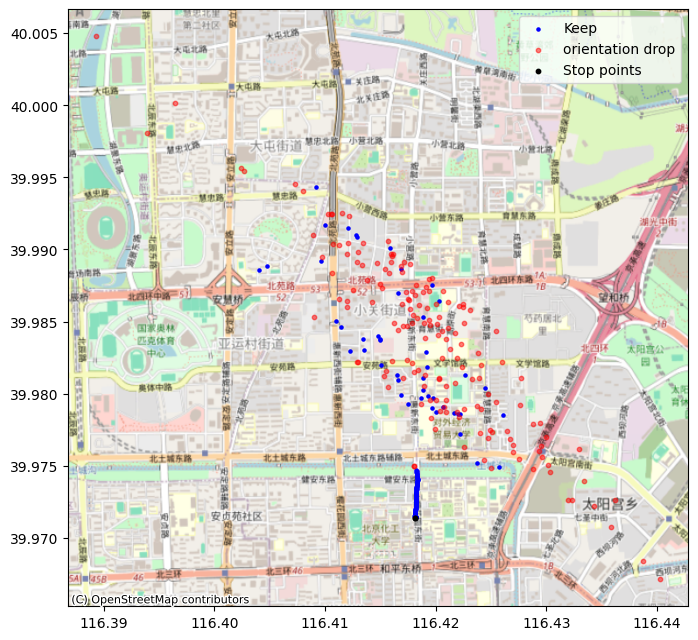

In [ ]:
# Visualize
fig, ax = plt.subplots(figsize=(8, 8))
gdf_test[gdf_test['to_remove'] == False].plot(
    ax=ax, color='blue', markersize=5, label='Keep'
)
gdf_test[gdf_test['orientation_drop'] == True].plot(
    ax=ax, color='red', markersize=10, alpha = 0.5, label='orientation drop'
)
gdf_test[(gdf_test['is_stop'] == True)].plot(
    ax=ax, color='black', markersize=10, label='Stop points'
)

# Add Basemap
ctx.add_basemap(ax,crs=crs_wgs84,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()


In [ ]:
output_path = os.path.join(DATA_ROOT_DIR, 'df_seg_2097.csv')
print(f"\nSaving final dataset to '{output_path}'")
seg_test.to_csv(output_path, index=False, na_rep="NaN")


Saving final dataset to '/content/drive/MyDrive/its_geolife/df_seg_2097.csv'


Visualize all 'stop/stay' segments

In [ ]:
df_staypoints = df_seg[(df_seg['to_remove'])&(~df_seg['orientation_drop'])]
len(df_staypoints)

1261722

In [ ]:
# Prepare the geoframe
gdf_stay=gpd.GeoDataFrame(
    df_staypoints.assign(geometry=\
                        df_staypoints[['lon','lat']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_wgs84)
gdf_stay = gdf_stay.to_crs(epsg=3857)
gdf_stay[columns]


,datetime,trip_id,modes,lon,lat,alt_m,dt_sec,distance,heading,speed,dist_2pts,is_stop,to_remove,orientation_drop,seg_id
123,2008-12-01 07:53:44,006_00255,bike,116.417477,39.987805,0.0000,2.0,0.145291,90.000000,0.072646,0.311176,True,True,False,6
124,2008-12-01 07:53:46,006_00255,bike,116.417476,39.987802,0.0000,2.0,0.449865,-104.326733,0.224932,0.878827,True,True,False,6
125,2008-12-01 07:53:48,006_00255,bike,116.417476,39.987799,0.0000,2.0,0.435874,-90.000000,0.217937,1.312352,True,True,False,6
126,2008-12-01 07:53:50,006_00255,bike,116.417475,39.987793,0.0000,2.0,0.878827,-97.277109,0.439413,3.550383,True,True,False,6
515,2008-12-01 08:06:48,006_00255,bike,116.422938,39.970033,0.0000,2.0,0.591582,79.153848,0.295791,0.622210,True,True,False,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5953460,2008-11-29 16:13:58,NaN,NaN,116.319317,40.007215,11.5824,2.0,1.092634,-156.482203,0.546317,3.045734,True,True,False,639742
5953498,2008-11-29 16:15:14,NaN,NaN,116.319430,40.008211,14.0208,2.0,6.460115,-109.111310,3.230058,9.202505,False,True,False,639750
5953499,2008-11-29 16:15:16,NaN,NaN,116.319413,40.008196,13.4112,2.0,2.886830,-130.960575,1.443415,6.876802,False,True,False,639750
5953500,2008-11-29 16:15:18,NaN,NaN,116.319397,40.008171,13.1064,2.0,4.046445,-116.114541,2.023223,3.196463,False,True,False,639750


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


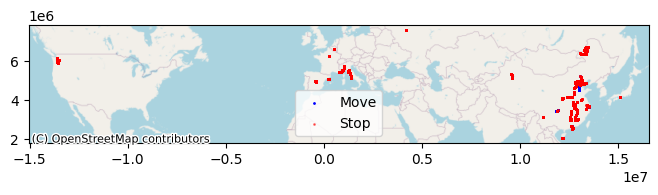

In [ ]:
# Visualize
fig, ax = plt.subplots(figsize=(8, 8))
gdf_stay[gdf_stay['is_stop'] == False].plot(
    ax=ax, color='blue', markersize=1, label='Move'
)
gdf_stay[gdf_stay['is_stop'] == True].plot(
    ax=ax, color='red', markersize=1, alpha=0.5, label='Stop'
)

# Add Basemap
ctx.add_basemap(ax,crs=crs_web,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

Check the segmentation per trip_id

In [ ]:
df_seg.groupby('trip_id')['seg_id'].unique().apply(len)

,seg_id
trip_id,
006_00000,10
006_00001,93
006_00002,5
006_00003,7
006_00004,4
...,...
031_00947,2
031_00948,1
031_00949,5


In [ ]:
df_t_006_00001 = df_seg[df_seg['trip_id']=='006_00001']
df_t_006_00001[columns]

,datetime,trip_id,modes,lon,lat,alt_m,dt_sec,distance,heading,speed,dist_2pts,is_stop,to_remove,orientation_drop,seg_id
115753,2008-09-15 10:37:31,006_00001,bike,116.422581,39.968031,0.0,39703.0,348.772363,-30.591726,0.008785,346.212523,True,True,True,15710
115754,2008-09-15 10:37:36,006_00001,bike,116.422562,39.968041,0.0,5.0,2.565786,145.521247,0.513157,1.829705,True,True,False,15710
115755,2008-09-15 10:37:41,006_00001,bike,116.422576,39.968043,0.0,5.0,1.585316,10.558733,0.317063,5.361074,True,True,False,15710
115756,2008-09-15 10:37:46,006_00001,bike,116.422610,39.968038,0.0,5.0,3.853910,-10.861998,0.770782,16.893044,True,True,True,15710
115757,2008-09-15 10:37:51,006_00001,bike,116.422717,39.968000,0.0,5.0,13.127868,-24.862328,2.625574,307.937177,False,True,True,15710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117012,2008-09-15 14:08:31,006_00001,bike,116.418727,39.969184,0.0,5.0,5.489200,-107.709796,1.097840,7.779377,False,False,False,15881
117013,2008-09-15 14:08:36,006_00001,bike,116.418711,39.969172,0.0,5.0,2.492084,-135.619265,0.498417,1.209051,True,True,False,15882
117014,2008-09-15 14:08:41,006_00001,bike,116.418730,39.969176,0.0,5.0,2.193420,15.360196,0.438684,4.621521,True,True,False,15882
117015,2008-09-15 14:08:46,006_00001,bike,116.418752,39.969177,0.0,5.0,2.453332,3.394232,0.490666,1.601642,True,True,False,15882


Take this bike trip for example, there are several stop segmentations within one trip - may show different stop patterns comparing with other modes

In [ ]:
# Prepare the geoframe
crs_wgs84 = CRS.from_epsg(4326) #WGS84
gdf_t_006_00001=gpd.GeoDataFrame(
    df_t_006_00001.assign(geometry=\
                        df_t_006_00001[['lon','lat']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_wgs84)
gdf_t_006_00001[columns]

,datetime,trip_id,modes,lon,lat,alt_m,dt_sec,distance,heading,speed,dist_2pts,is_stop,to_remove,orientation_drop,seg_id
115753,2008-09-15 10:37:31,006_00001,bike,116.422581,39.968031,0.0,39703.0,348.772363,-30.591726,0.008785,346.212523,True,True,True,15710
115754,2008-09-15 10:37:36,006_00001,bike,116.422562,39.968041,0.0,5.0,2.565786,145.521247,0.513157,1.829705,True,True,False,15710
115755,2008-09-15 10:37:41,006_00001,bike,116.422576,39.968043,0.0,5.0,1.585316,10.558733,0.317063,5.361074,True,True,False,15710
115756,2008-09-15 10:37:46,006_00001,bike,116.422610,39.968038,0.0,5.0,3.853910,-10.861998,0.770782,16.893044,True,True,True,15710
115757,2008-09-15 10:37:51,006_00001,bike,116.422717,39.968000,0.0,5.0,13.127868,-24.862328,2.625574,307.937177,False,True,True,15710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117012,2008-09-15 14:08:31,006_00001,bike,116.418727,39.969184,0.0,5.0,5.489200,-107.709796,1.097840,7.779377,False,False,False,15881
117013,2008-09-15 14:08:36,006_00001,bike,116.418711,39.969172,0.0,5.0,2.492084,-135.619265,0.498417,1.209051,True,True,False,15882
117014,2008-09-15 14:08:41,006_00001,bike,116.418730,39.969176,0.0,5.0,2.193420,15.360196,0.438684,4.621521,True,True,False,15882
117015,2008-09-15 14:08:46,006_00001,bike,116.418752,39.969177,0.0,5.0,2.453332,3.394232,0.490666,1.601642,True,True,False,15882


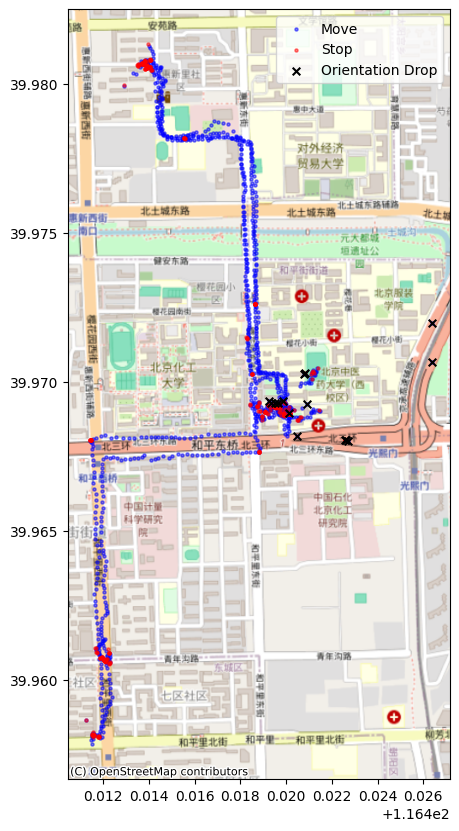

In [ ]:
# Visualize stay points
fig, ax = plt.subplots(figsize=(5,10))
gdf_t_006_00001[gdf_t_006_00001['is_stop'] == False].plot(
    ax=ax, color='blue', markersize=5, alpha=0.5, label='Move'
)
gdf_t_006_00001[gdf_t_006_00001['is_stop'] == True].plot(
    ax=ax, color='red', markersize=5, alpha=0.5, label='Stop'
)

if 'orientation_drop' in gdf_t_006_00001.columns:
    gdf_t_006_00001[gdf_t_006_00001['orientation_drop'] == True].plot(
        ax=ax, color='black', marker='x', markersize=30, label='Orientation Drop'
    )
# Add Basemap
ctx.add_basemap(ax,crs=crs_wgs84,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

/tmp/ipython-input-879700142.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


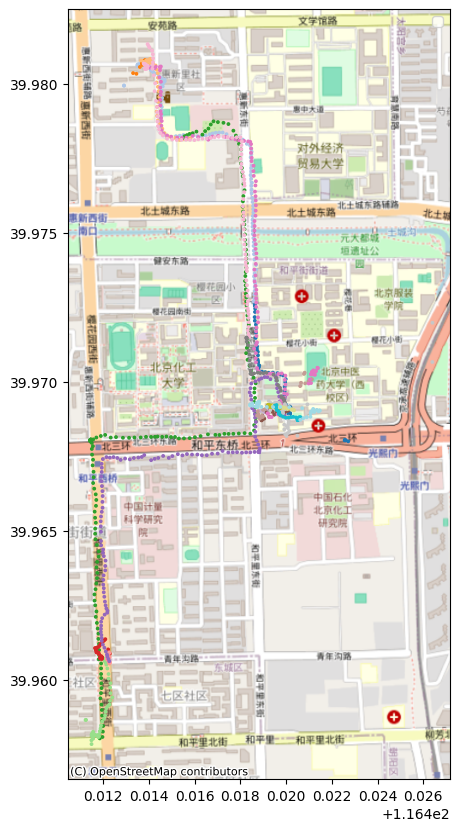

In [ ]:
gdf_t_006_00001['seg_id_cat'] = gdf_t_006_00001['seg_id'].astype('category')
# Visualize different segments
fig, ax = plt.subplots(figsize=(5,10))
gdf_t_006_00001.plot(ax=ax,column="seg_id_cat",cmap="tab20",legend=True,markersize=3)
# Add Basemap
ctx.add_basemap(ax,crs=crs_wgs84,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

Let's take a look at another trip - 006_00970 (mode: bus)

In [ ]:
df_t_006_00970 = df_seg[df_seg['trip_id']=='006_00970']
df_t_006_00970[columns]

,datetime,trip_id,modes,lon,lat,alt_m,dt_sec,distance,heading,speed,dist_2pts,is_stop,to_remove,orientation_drop,seg_id
495331,2009-09-13 16:10:01,006_00970,bus,116.478540,39.929325,0.0,2.0,3.473956,-30.095793,1.736978,2.874428,False,True,False,56749
495332,2009-09-13 16:10:03,006_00970,bus,116.478536,39.929346,0.0,2.0,3.080858,98.310092,1.540429,4.078377,False,True,False,56749
495333,2009-09-13 16:10:05,006_00970,bus,116.478537,39.929353,0.0,2.0,1.022250,83.748287,0.511125,1.328925,True,True,False,56749
495334,2009-09-13 16:10:07,006_00970,bus,116.478546,39.929341,0.0,2.0,2.009562,-60.095614,1.004781,3.451300,False,False,False,56751
495335,2009-09-13 16:10:09,006_00970,bus,116.478567,39.929347,0.0,2.0,2.494701,20.434803,1.247350,4.425513,False,False,False,56751
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
496920,2009-09-13 17:03:29,006_00970,bus,116.470030,39.856899,0.0,2.0,0.977403,117.101777,0.488702,2.496190,True,True,False,56914
496921,2009-09-13 17:03:31,006_00970,bus,116.470023,39.856908,0.0,2.0,1.520052,120.839698,0.760026,3.098646,True,True,False,56914
496922,2009-09-13 17:03:33,006_00970,bus,116.470015,39.856917,0.0,2.0,1.580013,124.307797,0.790006,1.767674,True,True,False,56914
496923,2009-09-13 17:03:35,006_00970,bus,116.470008,39.856904,0.0,2.0,2.039881,-112.457684,1.019940,2.803897,False,True,False,56914


In [ ]:
# Prepare the geoframe
crs_wgs84 = CRS.from_epsg(4326) #WGS84
gdf_t_006_00970=gpd.GeoDataFrame(
    df_t_006_00970.assign(geometry=\
                        df_t_006_00970[['lon','lat']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_wgs84)

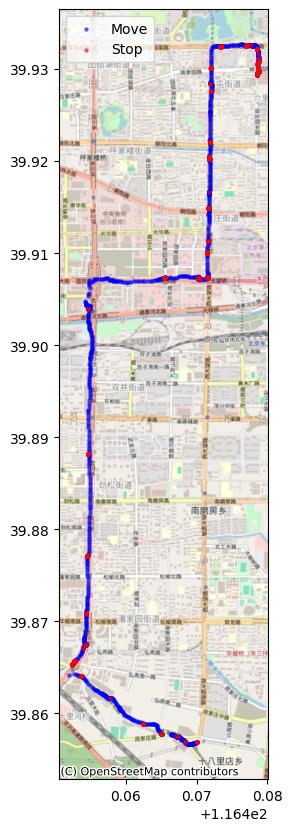

In [ ]:
# Visualize stay points
fig, ax = plt.subplots(figsize=(5,10))
gdf_t_006_00970[gdf_t_006_00970['is_stop'] == False].plot(
    ax=ax, color='blue', markersize=5, alpha=0.5, label='Move'
)
gdf_t_006_00970[gdf_t_006_00970['is_stop'] == True].plot(
    ax=ax, color='red', markersize=5, alpha=0.5, label='Stop'
)
# Add Basemap
ctx.add_basemap(ax,crs=crs_wgs84,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

/tmp/ipython-input-4275004354.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


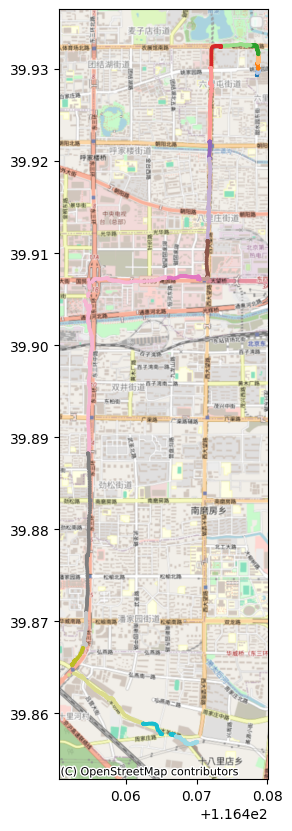

In [ ]:
gdf_t_006_00970['seg_id_cat'] = gdf_t_006_00970['seg_id'].astype('category')
# Visualize different segments
fig, ax = plt.subplots(figsize=(5,10))
gdf_t_006_00970.plot(ax=ax,column="seg_id_cat",cmap="tab20",legend=True,markersize=3)
# Add Basemap
ctx.add_basemap(ax,crs=crs_wgs84,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

In [ ]:
output_path = os.path.join(DATA_ROOT_DIR, 'df_segments.csv')
print(f"\nSaving final dataset to '{output_path}'")
df_seg.to_csv(output_path, index=False, na_rep="NaN")


Saving final dataset to '/content/drive/MyDrive/its_geolife/df_segments.csv'


## 3. Savitzky-Golay filter

Set window_size at 9, poly_order at 3 to smooth the raw trajectories.

The Savitzky–Golay filter assumes equally spaced samples, but GPS trajectories have irregular time intervals (dt_sec).
Therefore, instead of using deriv=1, we first smooth (x, y) with deriv=0 and then compute speed manually using the true time gaps — this avoids bias from unequal sampling, though differencing may reintroduce some noise.


In [ ]:
df_seg = pd.read_csv("/content/drive/MyDrive/its_geolife/df_segments.csv",parse_dates=["datetime"],na_values=["NaN"])

/tmp/ipython-input-1450634347.py:1: DtypeWarning: Columns (5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  df_seg = pd.read_csv("/content/drive/MyDrive/its_geolife/df_segments.csv",parse_dates=["datetime"],na_values=["NaN"])


In [ ]:
df_seg.describe()

,user_id,lat,lon,datetime,dt_sec,x,y,heading,distance,alt_m,speed,stop_group_local,stop_group,seg_id,dist_2pts,dt_heading
count,5.953522e+06,5.953522e+06,5.953522e+06,5953522,5.951282e+06,5.953522e+06,5.953522e+06,5.951282e+06,5.951282e+06,5.953522e+06,5.951282e+06,5.953522e+06,5.953522e+06,5.953522e+06,5.953520e+06,5.949041e+06
mean,1.973308e+01,4.003439e+01,1.104501e+02,2008-10-26 01:48:57.585347328,3.383287e+01,1.229525e+07,4.878716e+06,4.629069e+00,8.775238e+01,1.966364e+02,1.551693e+01,1.446911e+03,3.372069e+05,3.372068e+05,2.232635e+02,5.469828e+01
min,6.000000e+00,-2.138479e+01,-1.799696e+02,2007-04-12 18:18:53,1.000000e+00,-2.003412e+07,-2.437820e+06,-1.799938e+02,0.000000e+00,-9.983998e+03,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,1.200000e+01,3.993951e+01,1.163196e+02,2008-07-18 08:55:51.500000,2.000000e+00,1.294864e+07,4.857156e+06,-8.484879e+01,1.287424e+00,2.999232e+01,5.490184e-01,1.290000e+02,1.848270e+05,1.848270e+05,2.560348e+00,3.091475e+00
50%,2.100000e+01,3.998057e+01,1.163376e+02,2008-10-04 18:17:27,2.000000e+00,1.295064e+07,4.863119e+06,0.000000e+00,4.627352e+00,4.599432e+01,1.975646e+00,7.620000e+02,3.426440e+05,3.426440e+05,9.027404e+00,1.536585e+01
75%,2.700000e+01,4.000777e+01,1.164190e+02,2009-01-09 08:20:49.750000128,2.000000e+00,1.295971e+07,4.867071e+06,9.220315e+01,1.678291e+01,6.675120e+01,7.486300e+00,2.065000e+03,5.011250e+05,5.011250e+05,3.360455e+01,6.060615e+01
max,3.200000e+01,6.171240e+01,1.799969e+02,2009-09-28 22:28:04,2.935507e+06,2.003717e+07,8.791268e+06,1.800000e+02,4.007129e+07,9.999900e+04,6.444994e+06,1.205400e+04,6.397560e+05,6.397560e+05,4.006758e+07,3.599447e+02
std,8.230466e+00,2.658640e+00,3.200715e+01,NaN,2.866292e+03,3.563020e+06,3.962565e+05,1.021017e+02,3.155609e+04,1.142764e+03,3.753341e+03,1.826950e+03,1.828796e+05,1.828796e+05,5.236946e+04,8.582661e+01


In [ ]:
df_clean = df_seg[~df_seg['orientation_drop']]

In [ ]:
from scipy.signal import savgol_filter

def savgolfilter(series: pd.Series, window_length: int = 9, poly_order: int = 3) -> pd.Series:
    """
    Note, window_length has to be odd
    """
    # check for window size
    if len(series) <= (poly_order+1):
      return series
    elif len(series) < window_length:
      if len(series)%2==1:
        window_length = len(series)
      else:
        window_length = len(series)-1

    return pd.Series(savgol_filter(series, window_length, poly_order), index=series.index)

In [ ]:
window_length = 9
poly_order = 3

def apply_savgol_filter(df):
  df = df.copy()
  for col in ['x', 'y', 'alt_m']:
        df[f'{col}_smooth'] = df[col]

  df_to_smooth = df[~df['to_remove']].copy()

  for col in ['x', 'y', 'alt_m']:
    smooth_col = (
        df_to_smooth.groupby('seg_id')[col]
        .apply(lambda s: savgolfilter(s, window_length, poly_order))
    ).reset_index(level=0, drop=True)
    # Merge smoothed values back into the full dataframe
    df.loc[smooth_col.index, f'{col}_smooth'] = smooth_col.values

  return df

In [ ]:
df_smooth = apply_savgol_filter(df_seg)
df_smooth[['seg_id', 'x', 'x_smooth', 'y', 'y_smooth', 'alt_m', 'alt_m_smooth']].head(10)

,seg_id,x,x_smooth,y,y_smooth,alt_m,alt_m_smooth
0,1,1.295988e+07,1.295984e+07,4.864953e+06,4.864969e+06,0.0,0.0
1,1,1.295950e+07,1.295950e+07,4.865235e+06,4.865235e+06,0.0,0.0
2,1,1.295899e+07,1.295899e+07,4.865606e+06,4.865606e+06,0.0,0.0
3,1,1.295918e+07,1.295918e+07,4.865463e+06,4.865463e+06,0.0,0.0
4,1,1.295984e+07,1.295984e+07,4.864936e+06,4.864936e+06,0.0,0.0
5,1,1.295981e+07,1.295981e+07,4.864944e+06,4.864944e+06,0.0,0.0
6,1,1.295804e+07,1.295804e+07,4.866278e+06,4.866278e+06,0.0,0.0
7,1,1.295676e+07,1.295676e+07,4.867236e+06,4.867236e+06,0.0,0.0
8,1,1.295952e+07,1.295952e+07,4.865133e+06,4.865133e+06,0.0,0.0
9,1,1.295961e+07,1.295961e+07,4.865062e+06,4.865062e+06,0.0,0.0


Implementation of Kalman filter

Filter x,y and z(altitude) separetely

In [ ]:
import pandas as pd
import numpy as np
from typing import List

# --- Configuration Constants ---
TIME_THRESHOLD_SEC = 30  #to improve segmentation, if there is GPS signal missing more than 30 seconds within one trip, we will break the trip into two

# --- Kalman Filter Parameters ---
# 1. Horizontal R_2D (R_VAR): Assuming GPS coordination standard error is 7 meters.
R_VAR_2D = 7.0**2
# 2. Vertical noise R_1D (R_ALT_VAR): Assuming GPS altitude standard error is 10 meters。
R_VAR_1D = 10.0**2
# 3. Process noise Q (Q_VAR): 大幅减小，限制速度的突变，让模型更稳定（解决 airplane 异常）。
Q_VAR = 0.1**2

# --- 2D Kalman Filter (Horizontal Motion) ---

class KalmanFilter2D_CV:
    """
    2D 恒定速度模型卡尔曼滤波器: [x, y, vx, vy]^T
    """
    def __init__(self, R_VAR: float, Q_VAR: float):
        self.x = np.zeros(4)
        self.P = np.diag([1000.0, 1000.0, 10.0, 10.0])
        self.H = np.array([[1., 0., 0., 0.],
                           [0., 1., 0., 0.]])
        self.R = np.diag([R_VAR, R_VAR])
        self.Q_VAR = Q_VAR
        self.is_initialized = False

    def get_F_and_Q(self, dt: float) -> (np.ndarray, np.ndarray):
        """动态计算状态转移矩阵 F 和过程噪声 Q，依赖于时间步长 dt"""
        F = np.array([[1., 0., dt, 0.],
                      [0., 1., 0., dt],
                      [0., 0., 1., 0.],
                      [0., 0., 0., 1.]])

        Q = np.array([
            [0.25*dt**4, 0, 0.5*dt**3, 0],
            [0, 0.25*dt**4, 0, 0.5*dt**3],
            [0.5*dt**3, 0, dt**2, 0],
            [0, 0.5*dt**3, 0, dt**2]
        ]) * self.Q_VAR

        return F, Q

    def predict(self, dt: float):
        F, Q = self.get_F_and_Q(dt)
        self.x = F @ self.x
        self.P = F @ self.P @ F.T + Q

    def update(self, z: np.ndarray):
        y = z - self.H @ self.x
        S = self.H @ self.P @ self.H.T + self.R
        K = self.P @ self.H.T @ np.linalg.inv(S)
        self.x = self.x + K @ y
        self.P = (np.eye(4) - K @ self.H) @ self.P

    def process(self, measurement: np.ndarray, dt: float, is_stop: bool = False) -> np.ndarray:
        """处理单个时间步的测量值"""
        if not self.is_initialized:
            self.x = np.array([measurement[0], measurement[1], 0., 0.])
            self.is_initialized = True
            return self.x

        self.predict(dt)

        if is_stop:
            self.x[2] = 0.0 # vx = 0
            self.x[3] = 0.0 # vy = 0
            # 不进行 update，让位置保持预测状态
        else:
            self.update(measurement)

        return self.x

# --- 1D Kalman Filter (Vertical Motion) ---

class KalmanFilter1D_CV:
    """
    1D 恒定速度模型卡尔曼滤波器: [z, vz]^T
    """
    def __init__(self, R_VAR: float, Q_VAR: float):
        # 状态: [z, vz]
        self.x = np.zeros(2)
        # 协方差: [1000.0, 10.0]
        self.P = np.diag([100.0, 1.0])

        # 测量矩阵 H: 从状态映射到测量值 (只测量 z)
        self.H = np.array([[1., 0.]])

        # 测量噪声协方差 R: 1x1 矩阵
        self.R = np.array([[R_VAR]])
        self.Q_VAR = Q_VAR
        self.is_initialized = False

    def get_F_and_Q(self, dt: float) -> (np.ndarray, np.ndarray):
        """动态计算状态转移矩阵 F 和过程噪声 Q，依赖于时间步长 dt"""
        # 状态转移矩阵 F (恒定速度模型)
        F = np.array([[1., dt],
                      [0., 1.]])

        # 过程噪声协方差 Q (离散化后的 CV 模型噪声)
        Q = np.array([
            [0.25*dt**4, 0.5*dt**3],
            [0.5*dt**3, dt**2]
        ]) * self.Q_VAR

        return F, Q

    def predict(self, dt: float):
        F, Q = self.get_F_and_Q(dt)
        self.x = F @ self.x
        self.P = F @ self.P @ F.T + Q

    def update(self, z: np.ndarray):
        y = z - self.H @ self.x
        S = self.H @ self.P @ self.H.T + self.R
        K = self.P @ self.H.T @ np.linalg.inv(S)
        self.x = self.x + K @ y
        self.P = (np.eye(2) - K @ self.H) @ self.P

    def process(self, measurement: float, dt: float, is_stop: bool = False) -> np.ndarray:
        """处理单个时间步的测量值"""
        if not self.is_initialized:
            self.x = np.array([measurement, 0.0]) # 初始 z = alt_m, vz = 0
            self.is_initialized = True
            return self.x

        self.predict(dt)

        if is_stop:
            self.x[1] = 0.0 # 垂直速度 vz = 0
            # 不进行 update，让位置保持预测状态
        else:
            self.update(np.array([measurement]))

        return self.x

# --- 应用滤波器函数 ---

def apply_kalman_filter(group: pd.DataFrame, R_VAR_2D: float, R_VAR_1D: float, Q_VAR: float) -> pd.DataFrame:
    """对单个分段（group）应用 2D 和 1D 卡尔曼滤波"""

    kf_2d = KalmanFilter2D_CV(R_VAR=R_VAR_2D, Q_VAR=Q_VAR)
    kf_alt = KalmanFilter1D_CV(R_VAR=R_VAR_1D, Q_VAR=Q_VAR)

    results_2d = []
    results_1d = []

    for _, row in group.iterrows():
        dt = row['dt_sec']

        # 1. 处理水平 (x, y)
        measurement_2d = np.array([row['x'], row['y']])
        smoothed_state_2d = kf_2d.process(measurement_2d, dt, row['is_stop'])
        results_2d.append(smoothed_state_2d)

        # 2. 处理垂直 (z = alt_m)
        measurement_1d = row['alt_m']
        smoothed_state_1d = kf_alt.process(measurement_1d, dt, row['is_stop'])
        results_1d.append(smoothed_state_1d)

    # 结果 DataFrame 1 (2D)
    df_2d = pd.DataFrame(results_2d, columns=['x_smooth', 'y_smooth', 'vx_smooth', 'vy_smooth'], index=group.index)

    # 结果 DataFrame 2 (1D)
    df_1d = pd.DataFrame(results_1d, columns=['alt_m_smooth', 'vz_smooth'], index=group.index)

    return pd.concat([df_2d, df_1d], axis=1)

# --- 完整执行流程 ---

def run_kalman_processing(df: pd.DataFrame, R_VAR_2D: float, R_VAR_1D: float, Q_VAR: float, time_threshold_sec: int = TIME_THRESHOLD_SEC) -> pd.DataFrame:
    """
    主函数：执行卡尔曼滤波和最终 3D 速度计算。
    """
    df = df.copy()
    original_index = df.index
    df = df.reset_index(drop=True)

    # 1. 预处理：计算 dt_sec 和创建时间分割分段 ID
    df['dt_gap'] = df.groupby('seg_id')['dt_sec'].transform(
        lambda x: (x > time_threshold_sec).astype(int).cumsum()
    )
    df['seg_id_time_split'] = df['seg_id'].astype(str) + '_' + df['dt_gap'].astype(str)
    df = df.drop(columns=['dt_gap'], errors='ignore')

    # 2. 滤波：按 seg_id_time_split 分组应用 2D 和 1D 卡尔曼滤波
    kf_results_multiindex = df.groupby('seg_id_time_split').apply(
        lambda group: apply_kalman_filter(group, R_VAR_2D, R_VAR_1D, Q_VAR)
    )

    kf_results = kf_results_multiindex.reset_index(level=0, drop=True)
    df = df.join(kf_results)

    # 3. 计算：2D 平滑速度(仅考虑x,y)
    # 速度是 vx, vy, vz 三个分量的平方和的平方根
    df['speed_smooth'] = np.sqrt(
        df['vx_smooth']**2 +
        df['vy_smooth']**2 # <-- New: Including vertical velocity component
    )

    # 4. 确保停留点速度被精确归零
    df.loc[df['is_stop'], 'speed_smooth'] = 0.0

    # 5. 计算平滑后的距离和航向
    df['distance_smooth'] = df['speed_smooth'] * df['dt_sec']
    # 航向仍基于水平分量 (vx, vy)
    df['heading_smooth'] = np.degrees(np.arctan2(df['vy_smooth'], df['vx_smooth']))

    # 填充 NaN/Inf/None
    df['distance_smooth'] = df['distance_smooth'].fillna(0)
    df['heading_smooth'] = df['heading_smooth'].fillna(0)
    df['alt_m_smooth'] = df['alt_m_smooth'].fillna(df['alt_m']) # 初始 alt_m_smooth 设为原始 alt_m

    # 6. 恢复原始索引
    df.index = original_index

    return df

In [ ]:
df_smooth = run_kalman_processing(df_seg, R_VAR_2D=R_VAR_2D, R_VAR_1D=R_VAR_1D, Q_VAR=Q_VAR)

/tmp/ipython-input-393897023.py:190: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  kf_results_multiindex = df.groupby('seg_id_time_split').apply(


In [ ]:
df_smooth[['seg_id', 'x', 'x_smooth', 'y', 'y_smooth', 'speed', 'speed_smooth', 'distance', 'distance_smooth', 'alt_m', 'alt_m_smooth']].head(30)

,seg_id,x,x_smooth,y,y_smooth,speed,speed_smooth,distance,distance_smooth,alt_m,alt_m_smooth
0,1,1.295988e+07,1.295988e+07,4.864953e+06,4.864953e+06,NaN,0.000000,NaN,0.000000,0.0,0.0
1,1,1.295950e+07,1.295952e+07,4.865235e+06,4.865223e+06,235.510173,8.667494,471.020345,17.334988,0.0,0.0
2,1,1.295899e+07,1.295917e+07,4.865606e+06,4.865474e+06,316.582589,102.213640,633.165177,204.427281,0.0,0.0
3,1,1.295918e+07,1.295912e+07,4.865463e+06,4.865510e+06,118.638983,69.478354,237.277965,138.956708,0.0,0.0
4,1,1.295984e+07,1.295951e+07,4.864936e+06,4.865193e+06,424.963144,56.688644,849.926287,113.377288,0.0,0.0
5,1,1.295981e+07,1.295972e+07,4.864944e+06,4.865022e+06,15.657703,81.165543,31.315406,162.331086,0.0,0.0
6,1,1.295804e+07,1.295877e+07,4.866278e+06,4.865722e+06,554.513923,89.404515,2218.055693,357.618059,0.0,0.0
7,1,1.295676e+07,1.295771e+07,4.867236e+06,4.866513e+06,800.810673,205.523563,1601.621346,411.047127,0.0,0.0
8,1,1.295952e+07,1.295828e+07,4.865133e+06,4.866074e+06,1736.679619,99.173450,3473.359238,198.346900,0.0,0.0
9,1,1.295961e+07,1.295868e+07,4.865062e+06,4.865762e+06,54.204017,36.132921,108.408033,72.265842,0.0,0.0


In [ ]:
df_compare = df_smooth.groupby('modes').agg(
    speed_raw_mean=('speed', 'mean'),
    speed_smooth_mean=('speed_smooth', 'mean'),
    speed_raw_std=('speed', 'std'),
    speed_smooth_std=('speed_smooth', 'std'),
    dt_heading_raw_mean=('heading', lambda x: np.mean(np.abs(x.diff()))),
    dt_heading_smooth_mean=('heading_smooth', lambda x: np.mean(np.abs(x.diff()))),
    dt_heading_raw_std=('heading', lambda x: np.std(np.abs(x.diff()))),
    dt_heading_smooth_std=('heading_smooth', lambda x: np.std(np.abs(x.diff()))),
    distance_raw_mean=('distance', 'mean'),
    distance_smooth_mean=('distance_smooth', 'mean'),
    distance_raw_std=('distance', 'std'),
    distance_smooth_std=('distance_smooth', 'std'),
    alt_m_raw_mean=('alt_m', 'mean'),
    alt_m_smooth_mean=('alt_m_smooth', 'mean'),
    alt_m_raw_std=('alt_m', 'std'),
    alt_m_smooth_std=('alt_m_smooth', 'std'),
    count=('modes', 'size')
    ).sort_values(by='count', ascending=False)
df_compare

,speed_raw_mean,speed_smooth_mean,speed_raw_std,speed_smooth_std,dt_heading_raw_mean,dt_heading_smooth_mean,dt_heading_raw_std,dt_heading_smooth_std,distance_raw_mean,distance_smooth_mean,distance_raw_std,distance_smooth_std,alt_m_raw_mean,alt_m_smooth_mean,alt_m_raw_std,alt_m_smooth_std,count
modes,,,,,,,,,,,,,,,,,
walk,1.941720,1.302652,20.104790,8.985684,57.342297,22.808915,85.367050,53.625270,11.275474,3.372103,2109.911024,57.107302,98.367821,98.304344,235.039645,235.106948,1113120
bus,7.097926,6.576568,42.631735,57.907774,41.107259,15.102354,82.444163,48.447185,33.723855,18.101522,3973.673936,1509.365111,55.240772,55.244307,156.738775,157.315194,783631
bike,4.208536,3.670885,44.869750,3.138692,34.008266,11.621111,69.836154,40.960709,33.218390,8.643598,10373.262664,17.859787,48.434900,48.351015,92.696337,92.611553,490179
car,18.049348,11.958523,3966.767414,25.845518,27.310542,13.716788,72.478298,47.666627,94.625728,51.449692,20232.478688,142.213938,105.857675,105.953554,250.225789,250.672299,487918
subway,14.071795,13.520851,15.915608,11.270290,29.482040,13.537555,73.790291,47.114292,46.497466,29.299919,415.359970,61.976106,47.614075,47.607174,74.889846,75.157917,187186
train,26.491682,26.123266,25.835387,18.412871,11.916789,3.633447,47.915688,24.242739,80.836502,61.438702,2249.346542,106.385337,143.971627,143.912661,203.421692,203.417085,130430
taxi,11.733192,11.199497,10.793548,9.575923,35.998227,12.669856,85.271321,47.453937,44.933776,25.510204,4029.585754,73.108229,45.333402,45.327466,45.027187,45.103869,109540
airplane,938.270336,1061.288028,51845.306402,48598.479198,8.067652,5.929307,38.676882,28.832094,9842.365485,10612.002067,518832.549506,485903.564450,7886.767956,7886.762423,4049.363401,4049.396459,5979
boat,7.302672,6.905010,9.296665,9.376105,28.414669,25.111338,66.221975,53.864054,41.594683,40.319929,57.332182,57.539483,15.755385,15.744695,32.936242,32.934715,3602


Check one trip before and after applied Savitzky-Golay filter

In [ ]:
!pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 97.6 MB/s eta 0:00:00


In [ ]:
df_seg_test = df_smooth[df_smooth['trip_id']=='006_00001']

In [ ]:
import geopandas as gpd
import shapely.geometry
import contextily as ctx
import matplotlib.pyplot as plt

In [ ]:
gdf_before=gpd.GeoDataFrame(
    df_seg_test.assign(geometry=\
                        df_seg_test[['x','y']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_web)

In [ ]:
gdf_after=gpd.GeoDataFrame(
    df_seg_test.assign(geometry=\
                        df_seg_test[['x_smooth','y_smooth']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_web)

/tmp/ipython-input-2940941817.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


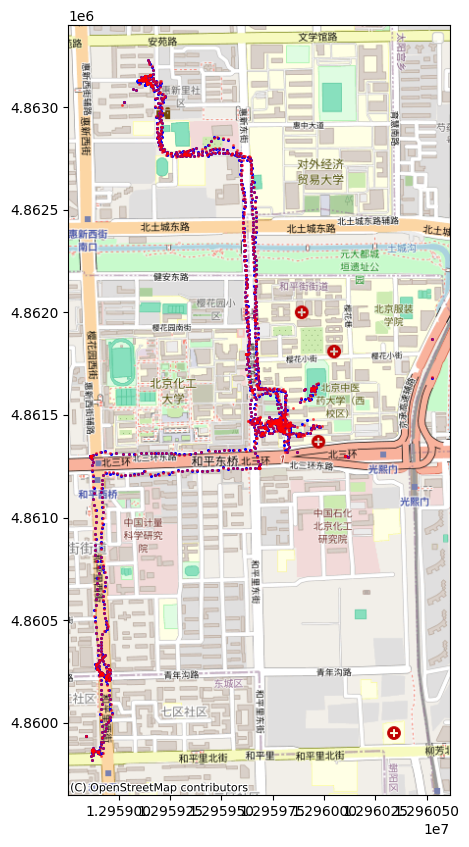

In [ ]:
# Visualize before and after S-G filter (the mode is bike)
fig, ax = plt.subplots(figsize=(10,10))
gdf_before.plot(ax=ax,color='blue',markersize=1.5)
gdf_after.plot(ax=ax,color='red',markersize=1.5,alpha=0.5)
# Add Basemap
ctx.add_basemap(ax,crs=crs_web,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

In [ ]:
df_seg_test = df_smooth[df_smooth['trip_id']=='006_00251']

In [ ]:
gdf_before=gpd.GeoDataFrame(
    df_seg_test.assign(geometry=\
                        df_seg_test[['x','y']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_web)

In [ ]:
gdf_after=gpd.GeoDataFrame(
    df_seg_test.assign(geometry=\
                        df_seg_test[['x_smooth','y_smooth']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_web)

/tmp/ipython-input-2811833091.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


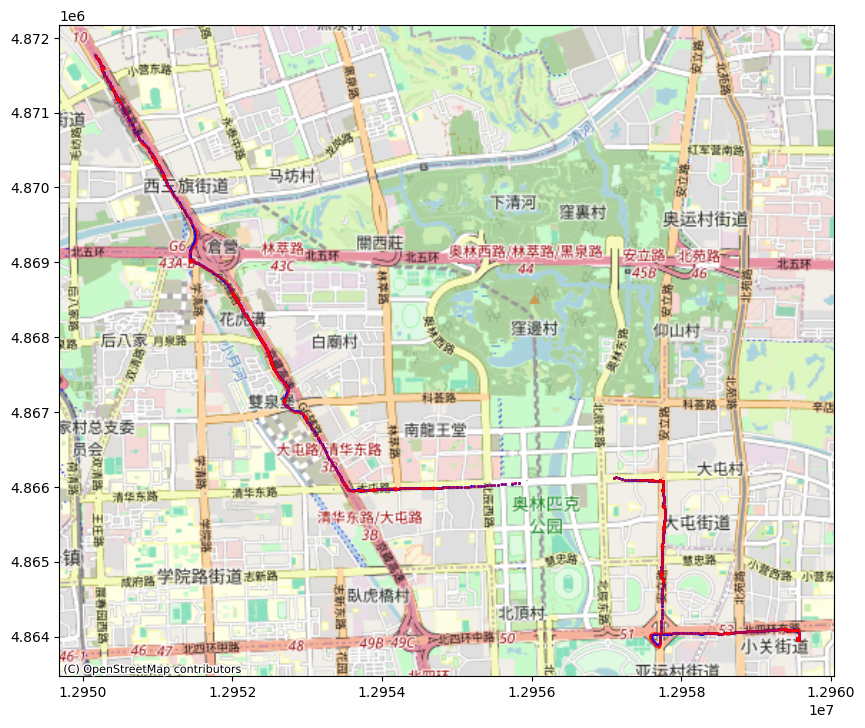

In [ ]:
# Visualize before and after S-G filter (the mode is bus)
fig, ax = plt.subplots(figsize=(10,10))
gdf_before.plot(ax=ax,color='blue',markersize=1.5)
gdf_after.plot(ax=ax,color='red',markersize=1.5,alpha=0.5)
# Add Basemap
ctx.add_basemap(ax,crs=crs_web,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

/tmp/ipython-input-1879873232.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


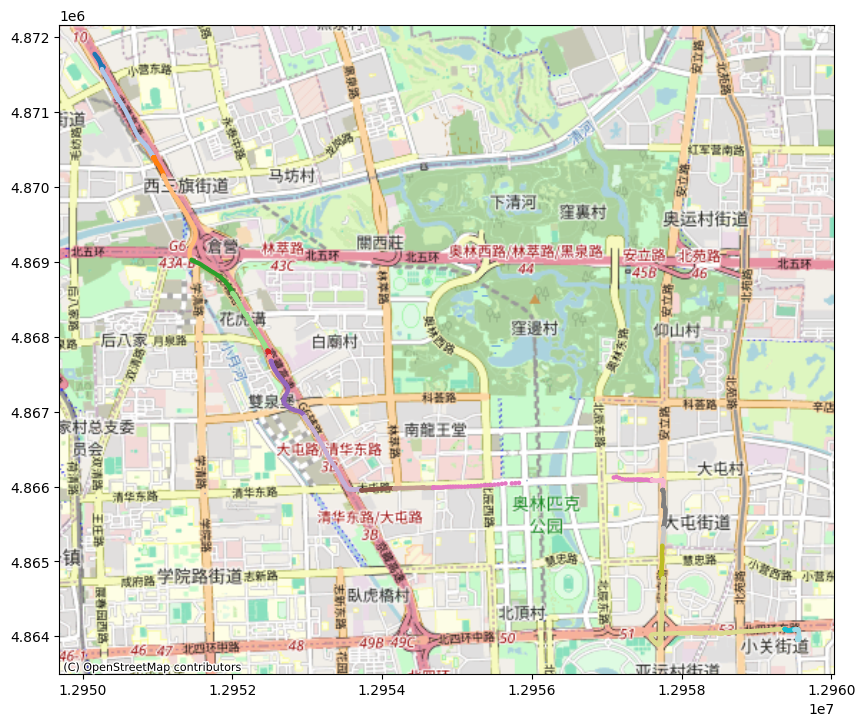

In [ ]:
gdf_before['seg_id_cat'] = gdf_before['seg_id'].astype('category')
# Visualize different segments
fig, ax = plt.subplots(figsize=(10,10))

gdf_before.plot(ax=ax,column="seg_id_cat",cmap='tab20',legend=True,markersize=5)
# Add Basemap
ctx.add_basemap(ax,crs=crs_web,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

In [ ]:
# calculate distance and heading after smooth
def cal_distance_heading(df):
  df['xs_prev'] = df.groupby(['seg_id'])['x_smooth'].shift(1)
  df['ys_prev'] = df.groupby(['seg_id'])['y_smooth'].shift(1)

  dx = df['x_smooth'] - df['xs_prev']
  dy = df['y_smooth'] - df['ys_prev']

  df['heading_smooth'] = np.degrees(np.arctan2(dy, dx))
  df['distance_smooth'] = np.sqrt(dx**2 + dy**2)
  df = df.drop(columns=['xs_prev','ys_prev'])

  return df

In [ ]:
df_smooth = cal_distance_heading(df_smooth)

In [ ]:
df_smooth['speed_smooth'] = df_smooth['distance_smooth']/df_smooth['dt_sec']
df_smooth[['seg_id', 'x', 'x_smooth', 'y', 'y_smooth', 'alt_m', 'alt_m_smooth', 'speed', 'speed_smooth', 'heading', 'heading_smooth']].head(30)

,seg_id,x,x_smooth,y,y_smooth,alt_m,alt_m_smooth,speed,speed_smooth,heading,heading_smooth
0,1,1.295988e+07,1.295984e+07,4.864953e+06,4.864969e+06,0.0,0.0,NaN,NaN,NaN,NaN
1,1,1.295950e+07,1.295950e+07,4.865235e+06,4.865235e+06,0.0,0.0,235.510173,214.844367,143.085030,141.663654
2,1,1.295899e+07,1.295899e+07,4.865606e+06,4.865606e+06,0.0,0.0,316.582589,316.582589,144.214043,144.214043
3,1,1.295918e+07,1.295918e+07,4.865463e+06,4.865463e+06,0.0,0.0,118.638983,118.638983,-37.013173,-37.013173
4,1,1.295984e+07,1.295984e+07,4.864936e+06,4.864936e+06,0.0,0.0,424.963144,424.963144,-38.297354,-38.297354
5,1,1.295981e+07,1.295981e+07,4.864944e+06,4.864944e+06,0.0,0.0,15.657703,15.657703,166.037988,166.037988
6,1,1.295804e+07,1.295804e+07,4.866278e+06,4.866278e+06,0.0,0.0,554.513923,554.513923,143.014724,143.014724
7,1,1.295676e+07,1.295676e+07,4.867236e+06,4.867236e+06,0.0,0.0,800.810673,800.810673,143.262469,143.262469
8,1,1.295952e+07,1.295952e+07,4.865133e+06,4.865133e+06,0.0,0.0,1736.679619,1736.679619,-37.270106,-37.270106
9,1,1.295961e+07,1.295961e+07,4.865062e+06,4.865062e+06,0.0,0.0,54.204017,54.204017,-40.546927,-40.546927


In [ ]:
df_test = df_smooth[df_smooth['seg_id']==1]
output_path = os.path.join(DATA_ROOT_DIR, 'df_seg1.csv')
print(f"\nSaving final dataset to '{output_path}'")
df_test.to_csv(output_path, index=False, na_rep="NaN")


Saving final dataset to '/content/drive/MyDrive/its_geolife/df_seg1.csv'


In [ ]:
df_test = df_smooth[df_smooth['seg_id']==1]
gdf_before=gpd.GeoDataFrame(
    df_test.assign(geometry=\
                        df_test[['x','y']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_web)

In [ ]:
gdf_after=gpd.GeoDataFrame(
    df_test.assign(geometry=\
                        df_test[['x_smooth','y_smooth']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_web)

/tmp/ipython-input-2811833091.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


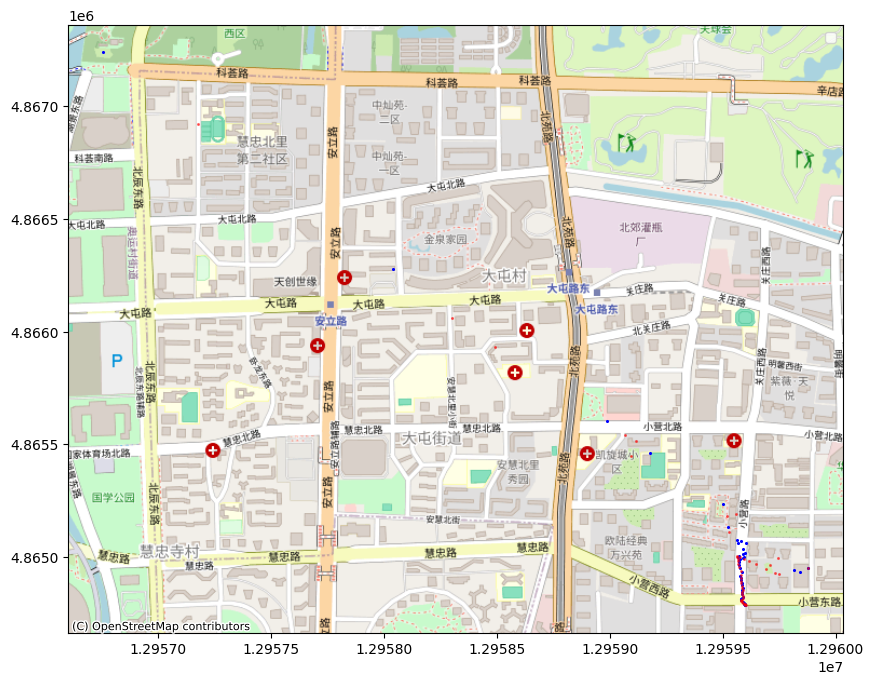

In [ ]:
# Visualize before and after S-G filter (the mode is bus)
fig, ax = plt.subplots(figsize=(10,10))
gdf_before.plot(ax=ax,color='blue',markersize=1.5)
gdf_after.plot(ax=ax,color='red',markersize=1.5,alpha=0.5)
# Add Basemap
ctx.add_basemap(ax,crs=crs_web,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

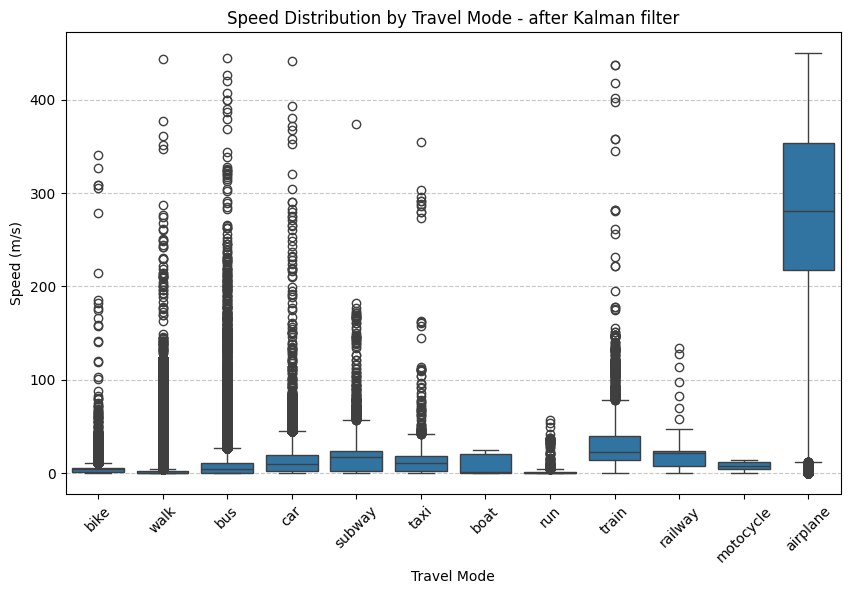

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

df_temp = df_smooth[df_smooth['speed_smooth']<=450]

plt.figure(figsize=(10, 6))
sns.boxplot(x='modes', y='speed_smooth', data=df_temp)

plt.title("Speed Distribution by Travel Mode - after Kalman filter")
plt.xlabel("Travel Mode")
plt.ylabel("Speed (m/s)")
plt.xticks(rotation=45)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
output_path = os.path.join(DATA_ROOT_DIR, 'df_smooth.csv')
print(f"\nSaving final dataset to '{output_path}'")
df_smooth.to_csv(output_path, index=False, na_rep="NaN")


Saving final dataset to '/content/drive/MyDrive/its_geolife/df_smooth.csv'


End of section2

In [ ]:
df_smooth = pd.read_csv("/content/drive/MyDrive/its_geolife/df_smooth.csv",parse_dates=["datetime"],na_values=["NaN"])

/tmp/ipython-input-597110983.py:1: DtypeWarning: Columns (5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  df_smooth = pd.read_csv("/content/drive/MyDrive/its_geolife/df_smooth.csv",parse_dates=["datetime"],na_values=["NaN"])


In [ ]:
df_smooth['trip_id'].value_counts()

,count
trip_id,
031_00197,18286
031_00182,17485
031_00438,16123
021_00160,16123
031_00476,14418
...,...
011_00244,1
012_01243,1
011_00116,1


In [ ]:
df_smooth[df_smooth['trip_id']=='011_00383']

,user_id,lat,lon,datetime,file_name,modes,trip_id,dt_sec,x,y,...,seg_id_time_split,x_smooth,y_smooth,vx_smooth,vy_smooth,alt_m_smooth,vz_smooth,speed_smooth,distance_smooth,heading_smooth
823799,11,39.907089,116.350987,2008-12-03 09:21:56,2008-12-04.plt,subway,011_00383,1945.0,1.295213e+07,4.852450e+06,...,101783_1,1.295213e+07,4.852450e+06,0.0,0.0,142.0368,0.0,0.0,0.0,0.0


In [ ]:
small_trips = df_smooth['trip_id'].map(df_smooth['trip_id'].value_counts()) <= 3
len(df_smooth[small_trips]['trip_id'].unique())

58

In [ ]:
df_smooth[df_smooth['user_id']==11]

,user_id,lat,lon,datetime,file_name,modes,trip_id,dt_sec,x,y,...,seg_id_time_split,x_smooth,y_smooth,vx_smooth,vy_smooth,alt_m_smooth,vz_smooth,speed_smooth,distance_smooth,heading_smooth
719951,11,39.975710,116.330763,2008-10-13 07:33:00,2008-10-13 majunyi.plt,subway,011_00194,NaN,1.294988e+07,4.862413e+06,...,84613_0,1.294988e+07,4.862413e+06,0.000000,0.000000,89.611200,0.000000,0.000000,0.000000,0.000000
719952,11,39.975719,116.330791,2008-10-13 07:33:02,2008-10-13 majunyi.plt,subway,011_00194,2.0,1.294988e+07,4.862414e+06,...,84613_0,1.294988e+07,4.862414e+06,0.057357,0.024058,89.922035,0.006095,0.062198,0.124396,22.755421
719953,11,39.975719,116.330822,2008-10-13 07:33:04,2008-10-13 majunyi.plt,subway,011_00194,2.0,1.294989e+07,4.862414e+06,...,84613_0,1.294989e+07,4.862414e+06,0.567876,0.025631,90.040686,0.011641,0.568454,1.136908,2.584236
719954,11,39.975706,116.330859,2008-10-13 07:33:06,2008-10-13 majunyi.plt,subway,011_00194,2.0,1.294989e+07,4.862413e+06,...,84613_0,1.294989e+07,4.862413e+06,1.207903,-0.268237,89.915213,-0.000445,1.237328,2.474657,-12.520391
719955,11,39.975562,116.331001,2008-10-13 07:33:08,2008-10-13 majunyi.plt,subway,011_00194,2.0,1.294991e+07,4.862392e+06,...,84613_0,1.294990e+07,4.862400e+06,2.969631,-2.759260,80.811560,-0.881151,4.053668,8.107336,-42.896978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1114224,11,39.975369,116.336541,2008-08-03 18:47:23,xiaoma_7-22.plt,NaN,NaN,2.0,1.295052e+07,4.862364e+06,...,137260_0,1.295052e+07,4.862363e+06,0.000000,0.000000,95.707200,0.000000,0.000000,0.000000,0.000000
1114225,11,39.975369,116.336542,2008-08-03 18:47:25,xiaoma_7-22.plt,NaN,NaN,2.0,1.295052e+07,4.862364e+06,...,137260_0,1.295052e+07,4.862363e+06,0.000000,0.000000,95.707200,0.000000,0.000000,0.000000,0.000000
1114226,11,39.975368,116.336542,2008-08-03 18:47:27,xiaoma_7-22.plt,NaN,NaN,2.0,1.295052e+07,4.862363e+06,...,137260_0,1.295052e+07,4.862363e+06,0.000000,0.000000,95.707200,0.000000,0.000000,0.000000,0.000000
1114227,11,39.975368,116.336540,2008-08-03 18:47:29,xiaoma_7-22.plt,NaN,NaN,2.0,1.295052e+07,4.862363e+06,...,137260_0,1.295052e+07,4.862363e+06,0.000000,0.000000,95.707200,0.000000,0.000000,0.000000,0.000000


In [ ]:
df_trip_bus = df_smooth[df_smooth['trip_id']=='011_00199']

In [ ]:
gdf_trip_bus=gpd.GeoDataFrame(
    df_trip_bus.assign(geometry=\
                        df_trip_bus[['lon','lat']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_wgs84)

In [ ]:
minx, miny, maxx, maxy = gdf_trip_bus.total_bounds
bbox = (minx, miny, maxx, maxy)
print(bbox)

(np.float64(116.419523), np.float64(39.935503), np.float64(116.43057), np.float64(39.940173))


In [ ]:
tags = {"highway": "bus_stop"}

gdf_bus = osmnx.features_from_bbox(bbox, tags)

/tmp/ipython-input-2490050882.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


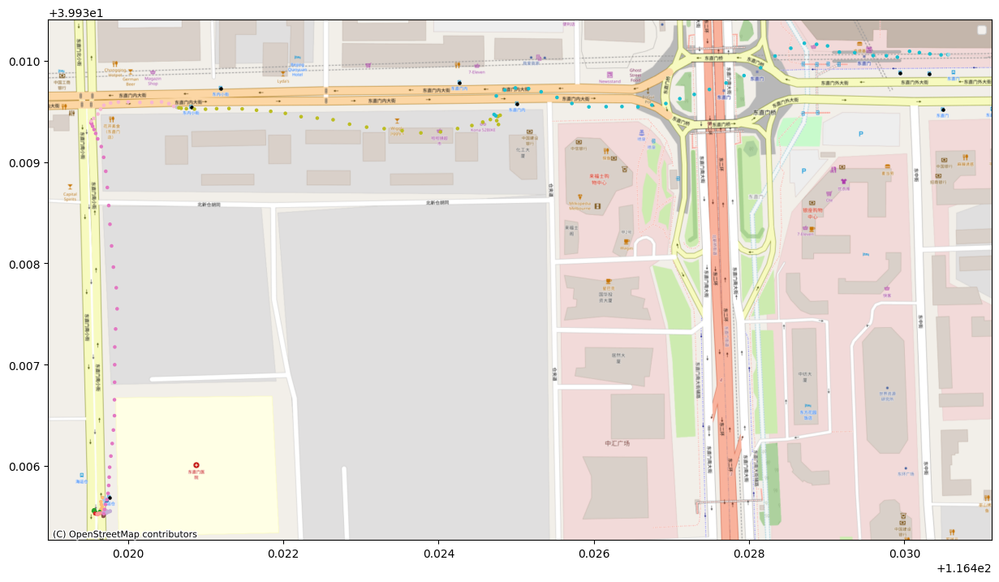

In [ ]:
gdf_trip_bus['seg_id_cat'] = gdf_trip_bus['seg_id'].astype('category')
# Visualize different segments
fig, ax = plt.subplots(figsize=(15,10))
gdf_bus.plot(ax=ax, markersize=5, color='black')
gdf_trip_bus.plot(ax=ax,column="seg_id_cat",cmap="tab20",markersize=5)
# Add Basemap
ctx.add_basemap(ax,crs=crs_wgs84,zoom=18,source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

In [ ]:
df_trip_test = df_smooth[df_smooth['trip_id']=='011_00194']

In [ ]:
df_trip_test['seg_id'].unique()

array([84613, 84615, 84617, 84619, 84621, 84624, 84629, 84630, 84631,
       84634, 84637, 84639, 84642, 84643, 84649, 84650, 84651, 84653,
       84655, 84659, 84660, 84661, 84664, 84666, 84668, 84671, 84672,
       84673, 84680, 84682, 84686, 84688, 84697])

In [ ]:
gdf_trip=gpd.GeoDataFrame(
    df_trip_test.assign(geometry=\
                        df_trip_test[['lon','lat']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_wgs84)

In [ ]:
minx, miny, maxx, maxy = gdf_trip.total_bounds
bbox = (minx, miny, maxx, maxy)
print(bbox)


(np.float64(116.330763), np.float64(39.933373), np.float64(116.427404), np.float64(39.975719))


In [ ]:
tags = {"railway": "subway_entrance"}

gdf_subway = osmnx.features_from_bbox(bbox, tags)

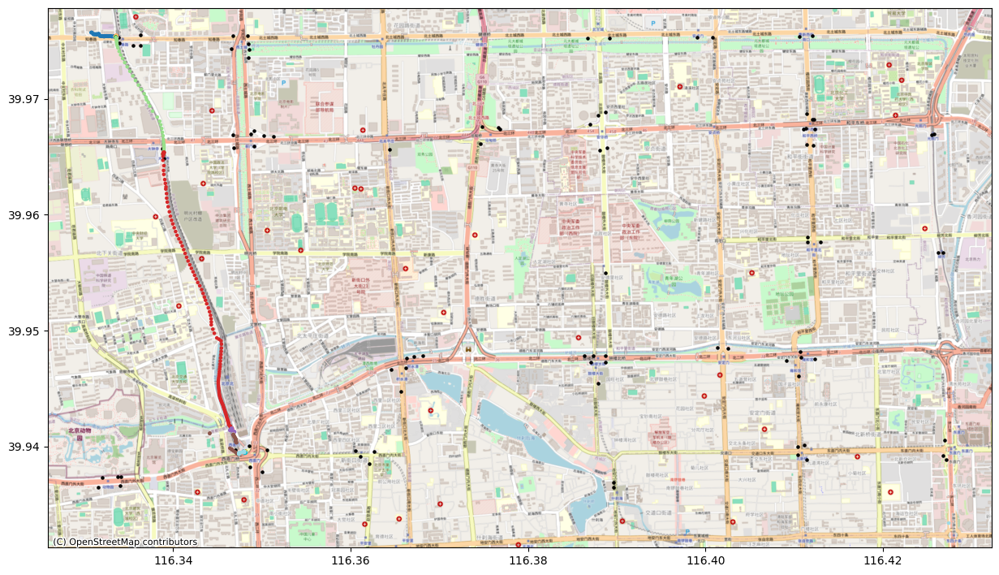

In [ ]:
# plot bus stops and metro stations
fig, ax = plt.subplots(figsize=(15,10))
gdf_subway.plot(ax=ax, markersize=5, color='black')
gdf_trip.plot(ax=ax,column="seg_id_cat",cmap="tab20",markersize=5)

# add base map
ctx.add_basemap(ax=ax,source=ctx.providers.OpenStreetMap.Mapnik,zoom=15,crs=crs_wgs84)

In [ ]:
df_smooth[df_smooth['modes']=='car']

,user_id,lat,lon,datetime,file_name,modes,trip_id,dt_sec,x,y,...,seg_id_time_split,x_smooth,y_smooth,vx_smooth,vy_smooth,alt_m_smooth,vz_smooth,speed_smooth,distance_smooth,heading_smooth
88774,6,39.969496,116.419844,2008-11-14 07:58:11,11月10-16.plt,car,006_00224,2.0,1.295980e+07,4.861511e+06,...,12973_0,1.295980e+07,4.861509e+06,-0.701073,3.121223,0.0,0.0,3.198990,6.397979,102.659385
88775,6,39.969555,116.419820,2008-11-14 07:58:13,11月10-16.plt,car,006_00224,2.0,1.295980e+07,4.861519e+06,...,12973_0,1.295980e+07,4.861516e+06,-0.903053,3.229671,0.0,0.0,3.353547,6.707095,105.621599
88776,6,39.969627,116.419806,2008-11-14 07:58:15,11月10-16.plt,car,006_00224,2.0,1.295979e+07,4.861530e+06,...,12973_0,1.295980e+07,4.861525e+06,-1.031557,3.402161,0.0,0.0,3.555110,7.110220,106.867645
88777,6,39.969698,116.419818,2008-11-14 07:58:17,11月10-16.plt,car,006_00224,2.0,1.295979e+07,4.861540e+06,...,12973_0,1.295979e+07,4.861534e+06,-1.035970,3.606276,0.0,0.0,3.752128,7.504255,106.027694
88778,6,39.969792,116.419874,2008-11-14 07:58:19,11月10-16.plt,car,006_00224,2.0,1.295980e+07,4.861554e+06,...,12973_0,1.295980e+07,4.861545e+06,-0.837288,3.904769,0.0,0.0,3.993529,7.987057,102.102493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5732691,31,40.006223,116.319880,2008-03-28 21:46:06,PPG_20080318192937.plt,car,031_00053,5.0,1.294867e+07,4.866847e+06,...,614554_0,1.294867e+07,4.866845e+06,1.501432,-1.218225,0.0,0.0,1.933487,9.667433,-39.055039
5732692,31,40.006237,116.319942,2008-03-28 21:46:11,PPG_20080318192937.plt,car,031_00053,5.0,1.294868e+07,4.866849e+06,...,614554_0,1.294868e+07,4.866844e+06,1.563932,-0.751672,0.0,0.0,1.735193,8.675965,-25.670328
5732693,31,40.006218,116.319960,2008-03-28 21:46:16,PPG_20080318192937.plt,car,031_00053,5.0,1.294868e+07,4.866846e+06,...,614554_0,1.294868e+07,4.866840e+06,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000
5732694,31,40.006208,116.319970,2008-03-28 21:46:21,PPG_20080318192937.plt,car,031_00053,5.0,1.294868e+07,4.866844e+06,...,614554_0,1.294868e+07,4.866840e+06,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000


In [ ]:
df_trip_car = df_smooth[df_smooth['trip_id']=='031_00053']

In [ ]:
gdf_trip_car=gpd.GeoDataFrame(
    df_trip_car.assign(geometry=\
                        df_trip_car[['lon','lat']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_wgs84)

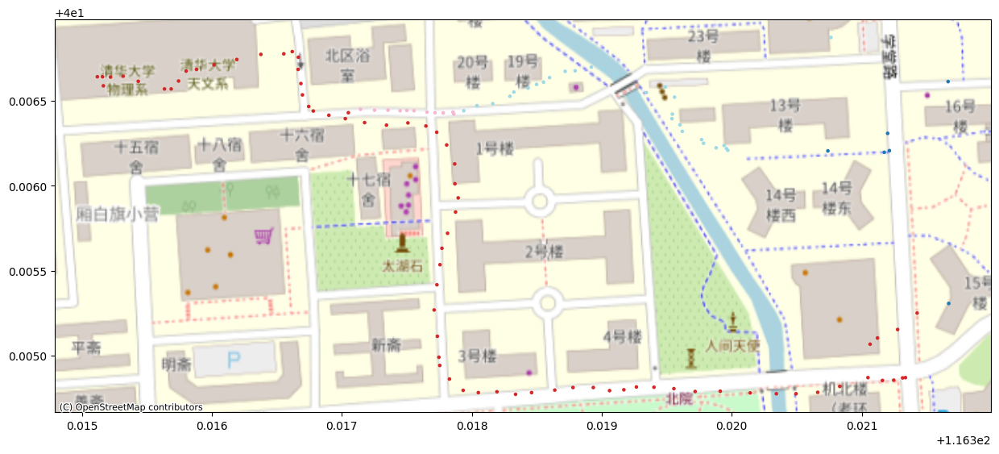

In [ ]:
# plot bus stops and metro stations
fig, ax = plt.subplots(figsize=(15,10))
gdf_trip_car.plot(ax=ax,column="seg_id",cmap="tab20",markersize=5)

# add base map
ctx.add_basemap(ax=ax,source=ctx.providers.OpenStreetMap.Mapnik,crs=crs_wgs84)

In [ ]:
df_trip_car = df_smooth[df_smooth['trip_id']=='006_00224']

In [ ]:
gdf_trip_car=gpd.GeoDataFrame(
    df_trip_car.assign(geometry=\
                        df_trip_car[['lon','lat']]\
                            .apply(tuple, axis=1)\
                            .apply(shapely.geometry.Point)
                   ),
    crs=crs_wgs84)

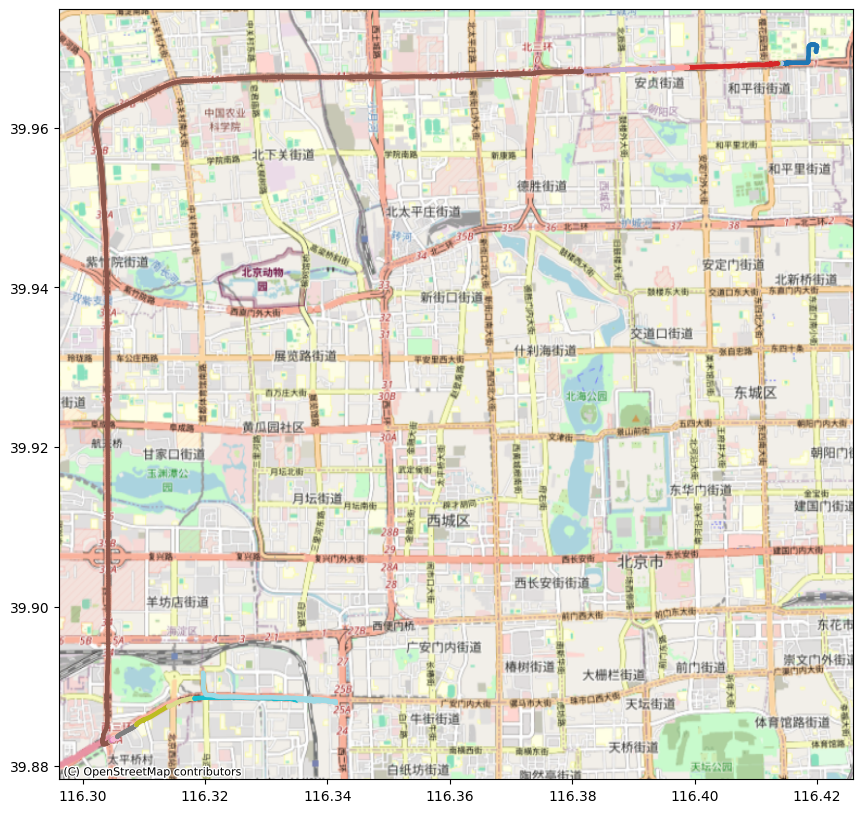

In [ ]:
# plot car route
fig, ax = plt.subplots(figsize=(15,10))
gdf_trip_car.plot(ax=ax,column="seg_id",cmap="tab20",markersize=5)

# add base map
ctx.add_basemap(ax=ax,source=ctx.providers.OpenStreetMap.Mapnik,crs=crs_wgs84)